In [1]:
%cd ..

/Users/jorgensandhaug/Documents/github_documents/option_pricing_framework


In [53]:
import numpy as np
def calculate_rate(K1, K2, C1, P1, C2, P2, T):
    """
    Calculate the implied rate using the box spread formula.

    Parameters:
    K1 (float): Strike price 1
    K2 (float): Strike price 2
    C1 (float): Call price for K1 (ask if buying, bid if selling)
    P1 (float): Put price for K1 (ask if buying, bid if selling)
    C2 (float): Call price for K2 (ask if buying, bid if selling)
    P2 (float): Put price for K2 (ask if buying, bid if selling)
    T (float): Time to maturity in years

    Returns:
    float: Calculated rate
    """
    guaranteed_payoff = K2 - K1
    initial_cost = C1 - P1 - C2 + P2

    transaction_costs = 3.05*4/100  # 4 transactions, fixed 2.05 usd for each 100, for the xcbf (CBOE CFE) exchange. For e.g. AMS exchange, it is 0.75 eur for each 100

    initial_cost += transaction_costs 
    guaranteed_payoff -= transaction_costs # The same transaction costs are deducted from the guaranteed payoff if we assume we sell the same options in the market at maturity

    if guaranteed_payoff > 0 and initial_cost <= 0:
        return np.inf
    if guaranteed_payoff <= 0 and initial_cost >= 0:
        return np.inf

    if np.abs(initial_cost) < 1e-6:
        return np.inf

    try: 
        rate = (guaranteed_payoff / initial_cost) ** (1 / T) - 1
    except:
        print("Error in calculating rate!")
        print(f"Initial cost: {initial_cost}, Guaranteed payoff: {guaranteed_payoff}, Time to maturity: {T}")
        return np.inf
    

    if guaranteed_payoff < 0 and rate < 0:
        print("Negative borrow rate found!")
        print(f"Initial loan given to you: {-initial_cost}")
        print(f"Amount to pay back: {-guaranteed_payoff}, after {T} years")
        print()

    return rate

# Time to maturity in years (207 days)
T = 25 / 365

import pandas as pd
from itertools import combinations

# Data extraction from the provided image
data = {
    "Strike Price": [600, 650, 700, 750, 800, 850, 900, 950, 1000],
    "Call Bid": [286.20, 238.45, 192.20, 149.10, 111.50, 78.30, 52.60, 34.05, 21.45],
    "Call Ask": [287.95, 240.05, 193.75, 150.45, 114.00, 79.15, 53.40, 34.80, 22.15],
    "Put Bid": [2.59, 4.25, 7.50, 13.65, 24.75, 41.80, 65.90, 97.45, 135.15],
    "Put Ask": [3.10, 4.85, 8.15, 14.35, 25.50, 42.50, 66.70, 98.35, 136.25]
}

df_new = pd.DataFrame(data)

invest_rates = []
borrow_rates = []

for i1 in range(len(df_new)):
    for i2 in range(len(df_new)):
        if i1 == i2:
            continue

        if i1 > i2:
            borrow = True
        else:
            borrow = False

        row1 = df_new.loc[i1]
        row2 = df_new.loc[i2]

        K1 = row1["Strike Price"]
        K2 = row2["Strike Price"]

        C1 = row1["Call Ask"]  # Buy call
        P1 = row1["Put Bid"]  # Sell put
        C2 = row2["Call Bid"]  # Sell call
        P2 = row2["Put Ask"]  # Buy put

        rate = calculate_rate(K1, K2, C1, P1, C2, P2, T)
        if borrow:
            borrow_rates.append((K1, K2, rate))

        else:
            invest_rates.append((K1, K2, rate))

borrow_rates_sorted = sorted(borrow_rates, key=lambda x: x[2])
invest_rates_sorted = sorted(invest_rates, key=lambda x: x[2], reverse=True)

print("Borrow Rates (sorted):")
for result in borrow_rates_sorted:
    print(f"Strike Prices: {result[0]} and {result[1]}, Rate: {result[2]:.4f}")

print("\nInvest Rates (sorted):")
for result in invest_rates_sorted:
    print(f"Strike Prices: {result[0]} and {result[1]}, Rate: {result[2]:.4f}")

    
# Best borrow and invest rates
best_borrow = borrow_rates_sorted[0]
best_invest = invest_rates_sorted[0]

print(f"\nBest Borrow Rate: Strike Prices: {best_borrow[0]} and {best_borrow[1]}, Rate: {best_borrow[2]:.4f}")
print(f"Best Invest Rate: Strike Prices: {best_invest[0]} and {best_invest[1]}, Rate: {best_invest[2]:.4f}")
print(f"Spread: {-best_invest[2] + best_borrow[2]:.4f}")

Borrow Rates (sorted):
Strike Prices: 1000.0 and 800.0, Rate: 0.0953
Strike Prices: 1000.0 and 850.0, Rate: 0.1516
Strike Prices: 1000.0 and 750.0, Rate: 0.1576
Strike Prices: 1000.0 and 600.0, Rate: 0.1642
Strike Prices: 1000.0 and 650.0, Rate: 0.1650
Strike Prices: 950.0 and 800.0, Rate: 0.1687
Strike Prices: 1000.0 and 700.0, Rate: 0.1691
Strike Prices: 950.0 and 600.0, Rate: 0.2076
Strike Prices: 950.0 and 650.0, Rate: 0.2160
Strike Prices: 1000.0 and 900.0, Rate: 0.2181
Strike Prices: 950.0 and 700.0, Rate: 0.2316
Strike Prices: 950.0 and 750.0, Rate: 0.2324
Strike Prices: 900.0 and 600.0, Rate: 0.2557
Strike Prices: 900.0 and 650.0, Rate: 0.2762
Strike Prices: 900.0 and 800.0, Rate: 0.2925
Strike Prices: 950.0 and 850.0, Rate: 0.3021
Strike Prices: 850.0 and 600.0, Rate: 0.3030
Strike Prices: 900.0 and 700.0, Rate: 0.3126
Strike Prices: 900.0 and 750.0, Rate: 0.3419
Strike Prices: 850.0 and 650.0, Rate: 0.3422
Strike Prices: 850.0 and 700.0, Rate: 0.4174
Strike Prices: 750.0 and 

# Getting Stock Option Instruments

In [83]:
# Retrieve the access token from data/saxo_api_key.txt
api_key = None
with open("data/saxo_api_key.txt", "r") as f:
    api_key = f.read().strip()
if not api_key:
    raise ValueError("SAXO_API_KEY environment variable not set")

In [3]:
import requests
import urllib.parse
import os
# api_key = os.getenv("SAXO_SIM_API_KEY")
account_key = os.getenv("SAXO_SIM_ACCOUNT_KEY")
exchanges = ["CBOE_SO", "EUR_ASM2", "OCC", "OPRA"]
exchange_id = exchanges[3]


# print(f"API Key retrieved: {api_key}")

base_url = "https://gateway.saxobank.com/openapi"


# Function to fetch all instruments with pagination
def fetch_all_instruments(base_url, account_key, api_key, max_attempts):
    instruments_url = f"/ref/v1/instruments?AssetTypes=StockOption&ExchangeId={exchange_id}" #&AccountKey={account_key}"
    all_instruments = []

    url = base_url + instruments_url
    attempts = 0

    while url and attempts < max_attempts:
        response = requests.get(url, headers={"Authorization": f"Bearer {api_key}", "Content-Type": "application/json"})
        if response.status_code == 200:
            data = response.json()
            all_instruments.extend(data['Data'])
            url = data.get('__next', None)
        else:
            print(f"Failed to fetch instruments: {response.status_code}")
            print(response.text)
            return all_instruments
        attempts += 1

    return all_instruments

#base_url = "https://gateway.saxobank.com/sim/openapi"
# Fetch all instruments with a maximum of n attempts
max_attempts = 30  # Set your desired maximum number of attempts here
all_instruments = fetch_all_instruments(base_url, account_key, api_key, max_attempts)
print(f"Total instruments fetched: {len(all_instruments)}")
for instrument in all_instruments:
    print(instrument)

    
# Filter out the instruments where 'Symbol' doesnt include ':xcbf'
instruments = [instrument for instrument in all_instruments if 'Symbol' in instrument and ':xcbf' in instrument['Symbol']]

Total instruments fetched: 1500
{'AssetType': 'StockOption', 'CanParticipateInMultiLegOrder': True, 'Description': 'CEL-SCI Corp.', 'ExchangeId': 'OPRA', 'GroupId': 951, 'GroupOptionRootId': 2732, 'Identifier': 2732, 'SummaryType': 'ContractOptionRoot', 'Symbol': 'CVM:xcbf'}
{'AssetType': 'StockOption', 'CanParticipateInMultiLegOrder': True, 'Description': 'Apple Hospitality REIT Inc.', 'ExchangeId': 'OPRA', 'GroupId': 9930, 'GroupOptionRootId': 2705, 'Identifier': 2705, 'SummaryType': 'ContractOptionRoot', 'Symbol': 'APLE:xcbf'}
{'AssetType': 'StockOption', 'CanParticipateInMultiLegOrder': True, 'Description': 'BigCommerce Holdings Inc.', 'ExchangeId': 'OPRA', 'GroupId': 18361, 'GroupOptionRootId': 2342, 'Identifier': 2342, 'SummaryType': 'ContractOptionRoot', 'Symbol': 'BIGC:xcbf'}
{'AssetType': 'StockOption', 'CanParticipateInMultiLegOrder': True, 'Description': 'ProShares UltraShort Financials', 'ExchangeId': 'OPRA', 'GroupId': 29063, 'GroupOptionRootId': 2336, 'Identifier': 2336, 

# Getting Option chains market data

In [90]:
import uuid
import time
import random
import string
def generate_valid_id():
    # Generate a UUID and replace dashes with underscores
    valid_id = str(uuid.uuid4()).replace('-', '_')
    # Ensure it doesn't start with an underscore
    if valid_id[0] == '_':
        valid_id = random.choice(string.ascii_letters) + valid_id[1:]
    # Truncate to ensure the length is within 50 characters
    return valid_id[:50]

url = "/trade/v1/optionschain/subscriptions"

# all_instruments = [{"Identifier": 236, "Description": "ASML Holding NV"},]

start_from = 1322
for i, instrument in enumerate(all_instruments[start_from:], start=start_from):
    
    request_format = {
    "Arguments": {
        "Identifier": instrument["Identifier"],
        "AssetType": "StockOption",
        "Expiries": [
            {"Index": 0},
            {"Index": 1},
            {"Index": 3},
            {"Index": 5},
            {"Index": 8},
        ],
        "MaxStrikesPerExpiry": 19,
    },
    "ContextId": generate_valid_id(),
    "ReferenceId": generate_valid_id(),
    # "RefreshRate": 5000
    }


    def send():
        # send post request
        response = requests.post(base_url + url, json=request_format, headers={"Authorization": f"Bearer {api_key}", "Content-Type": "application/json"})
        # print("Response:", response)
        try:
            response_data = response.json()
            if "ErrorCode" in response_data:
                print(f"Failed to fetch data for instrument {i}: {response_data}")
                if response_data["ErrorCode"] == "SubscriptionLimitExceeded":
                    time.sleep(30)
                    return send()                    
                    
        except ValueError:
            print("Failed to parse response data, response code:", response.status_code)
            print(f"Stopped at instrument {i} (probably due to token expiration)")

            return None
            


        # print("Response Data:", response_data)
        return response_data

    response_data = send()
    if response_data:
        instrument["Data"] = response_data
    else:
        break


Failed to fetch data for instrument 1322: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrument 1332: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrument 1342: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrument 1352: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrument 1362: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrument 1372: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrument 1382: {'ErrorCode': 'SubscriptionLimitExceeded', 'Message': 'Subscription limit exceeded. Max is 10'}
Failed to fetch data for instrumen

In [102]:
all_instruments[0]["Data"]

# Find the one with DOW in symbol
dow_instrument = None
for instrument in all_instruments:
    if "Symbol" in instrument and "QCOM" in instrument["Symbol"]:
        dow_instrument = instrument
        break
    
dow_instrument

{'AssetType': 'StockOption',
 'CanParticipateInMultiLegOrder': True,
 'Description': 'Qualcomm Inc. ',
 'ExchangeId': 'OPRA',
 'GroupId': 96,
 'GroupOptionRootId': 323,
 'Identifier': 323,
 'SummaryType': 'ContractOptionRoot',
 'Symbol': 'QCOM:xcbf',
 'Data': {'Snapshot': {'LastUpdated': '2024-05-28T16:57:06.852768Z',
   'ExpiryCount': 15,
   'Expiries': [{'Index': 0,
     'Expiry': '2024-05-31T20:00:00.000000Z',
     'LastTradeDate': '2024-05-31T20:00:00.000000Z',
     'DisplayDaysToExpiry': 3,
     'StrikeCount': 53,
     'Strikes': [{'Index': 0, 'Strike': 95.0},
      {'Index': 1, 'Strike': 100.0},
      {'Index': 2, 'Strike': 105.0},
      {'Index': 3, 'Strike': 110.0},
      {'Index': 4, 'Strike': 115.0},
      {'Index': 5, 'Strike': 120.0},
      {'Index': 6, 'Strike': 125.0},
      {'Index': 7, 'Strike': 130.0},
      {'Index': 8, 'Strike': 135.0},
      {'Index': 9, 'Strike': 140.0},
      {'Index': 10, 'Strike': 145.0},
      {'Index': 11, 'Strike': 150.0},
      {'Index': 12,

In [92]:
# Flatten the data into a list of dictionaries
data = {}
for instrument in all_instruments:

    # print(instrument["Data"])
    if not "Data" in instrument or not instrument["Data"] or "ErrorCode" in instrument["Data"]:
        continue

    name = instrument["Symbol"]
    for expiry in instrument["Data"]["Snapshot"]["Expiries"]:
        if 'Strikes' not in expiry:
            continue

        exp_date = pd.to_datetime(expiry['Expiry'])

        for strike in expiry['Strikes']:
            if not "Call" in strike or not "Put" in strike:
                continue
            
            if not "Ask" in strike["Call"] or not "Bid" in strike["Call"]:
                continue
            if not "Ask" in strike["Put"] or not "Bid" in strike["Put"]:
                continue

            if name not in data:
                data[name] = {}
            if exp_date not in data[name]:
                data[name][exp_date] = {}
            data[name][exp_date][strike["Strike"]] = strike

data

{'APLE:xcbf': {Timestamp('2025-01-17 21:00:00+0000', tz='UTC'): {15.0: {'Index': 3,
    'Put': {'Bid': 1.25,
     'Ask': 1.85,
     'PriceTypeBid': 'Indicative',
     'PriceTypeAsk': 'Indicative',
     'Uic': 42216506,
     'High': 1.5,
     'Low': 1.3,
     'Open': 1.35,
     'LastClose': 1.63557,
     'NetChange': 0.0,
     'LastTraded': 1.63557,
     'BidSize': 431.0,
     'AskSize': 497.0,
     'Volume': 0.0,
     'OpenInterest': 328.0},
    'Call': {'Bid': 0.6,
     'Ask': 0.75,
     'PriceTypeBid': 'Indicative',
     'PriceTypeAsk': 'Indicative',
     'Uic': 42216494,
     'High': 0.65,
     'Low': 0.55,
     'Open': 0.55,
     'LastClose': 0.64031,
     'NetChange': 0.00968999999999976,
     'LastTraded': 0.65,
     'BidSize': 33.0,
     'AskSize': 46.0,
     'Volume': 46.0,
     'OpenInterest': 16.0},
    'Strike': 15.0}}},
 'SLQT:xcbf': {Timestamp('2024-07-19 20:00:00+0000', tz='UTC'): {2.5: {'Index': 0,
    'Put': {'Bid': 0.05,
     'Ask': 0.2,
     'PriceTypeBid': 'Indicativ

In [93]:
import datetime
import pytz

def calc_time_to_maturity(expiry):
    """
    Calculate the time to maturity in years.

    Parameters:
    expiry (datetime): Expiry date

    Returns:
    float: Time to maturity in years
    """
    current_date = datetime.datetime.now(pytz.UTC)  # Make current_date timezone-aware
    time_difference = expiry - current_date
    return time_difference.total_seconds() / (365 * 24 * 60 * 60)


rates = {}

for name, expiries in data.items():
    rates[name] = {}

    for expiry, strikes in expiries.items():
        if len(strikes.items()) < 2:
            continue

        T = calc_time_to_maturity(expiry)


        invest_rates = []
        borrow_rates = []

        for strike1 in strikes.keys():
            for strike2 in strikes.keys():
                if strike1 == strike2:
                    continue

                if strike1 > strike2:
                    borrow = True
                else:
                    borrow = False

                C1 = strikes[strike1]["Call"]["Ask"]  # Buy call
                P1 = strikes[strike1]["Put"]["Bid"]  # Sell put
                C2 = strikes[strike2]["Call"]["Bid"]  # Sell call
                P2 = strikes[strike2]["Put"]["Ask"]  # Buy put

                rate = calculate_rate(strike1, strike2, C1, P1, C2, P2, T)
                if borrow:
                    borrow_rates.append((strike1, strike2, rate))
                else:
                    invest_rates.append((strike1, strike2, rate))

        borrow_rates_sorted = sorted(borrow_rates, key=lambda x: x[2])
        invest_rates_sorted = sorted(invest_rates, key=lambda x: x[2], reverse=True)

        # Best borrow and invest rates
        best_borrow = borrow_rates_sorted[0]
        best_invest = invest_rates_sorted[0]

        rates[name][expiry] = {
            "best_borrow": best_borrow,
            "best_invest": best_invest,
            "spread": -best_invest[2] + best_borrow[2]
        }
        

rates

Negative borrow rate found!
Initial loan given to you: 15.128
Amount to pay back: 15.122, after 0.4685629945172184 years

Negative borrow rate found!
Initial loan given to you: 10.128000000000002
Amount to pay back: 10.122, after 0.4685629945172184 years

Negative borrow rate found!
Initial loan given to you: 25.178
Amount to pay back: 25.122, after 0.1424214417141362 years

Negative borrow rate found!
Initial loan given to you: 24.128
Amount to pay back: 24.122, after 0.1424214417141362 years

Negative borrow rate found!
Initial loan given to you: 23.178
Amount to pay back: 23.122, after 0.1424214417141362 years

Negative borrow rate found!
Initial loan given to you: 22.178
Amount to pay back: 22.122, after 0.1424214417141362 years

Negative borrow rate found!
Initial loan given to you: 21.278000000000002
Amount to pay back: 21.122, after 0.1424214417141362 years

Negative borrow rate found!
Initial loan given to you: 20.228
Amount to pay back: 20.122, after 0.1424214417141362 years



{'APLE:xcbf': {},
 'SLQT:xcbf': {},
 'FRSH:xcbf': {Timestamp('2024-06-21 20:00:00+0000', tz='UTC'): {'best_borrow': (15.0,
    12.5,
    22.973612548426424),
   'best_invest': (12.5, 15.0, -0.9261123988784592),
   'spread': 23.899724947304883},
  Timestamp('2024-07-19 20:00:00+0000', tz='UTC'): {'best_borrow': (20.0,
    12.5,
    0.8586039239086325),
   'best_invest': (12.5, 20.0, -0.3931727725609716),
   'spread': 1.2517766964696042},
  Timestamp('2024-11-15 21:00:00+0000', tz='UTC'): {'best_borrow': (20.0,
    10.0,
    0.12512893635696298),
   'best_invest': (10.0, 20.0, -0.10810894107879587),
   'spread': 0.23323787743575886}},
 'LIN_US:xcbf': {Timestamp('2025-06-20 20:00:00+0000', tz='UTC'): {'best_borrow': (450.0,
    350.0,
    0.10687662457727365),
   'best_invest': (340.0, 450.0, -0.0196620795524034),
   'spread': 0.12653870412967705}},
 'MGK:xcbf': {Timestamp('2024-06-21 20:00:00+0000', tz='UTC'): {'best_borrow': (325.0,
    255.0,
    1.972399625342168),
   'best_invest': (

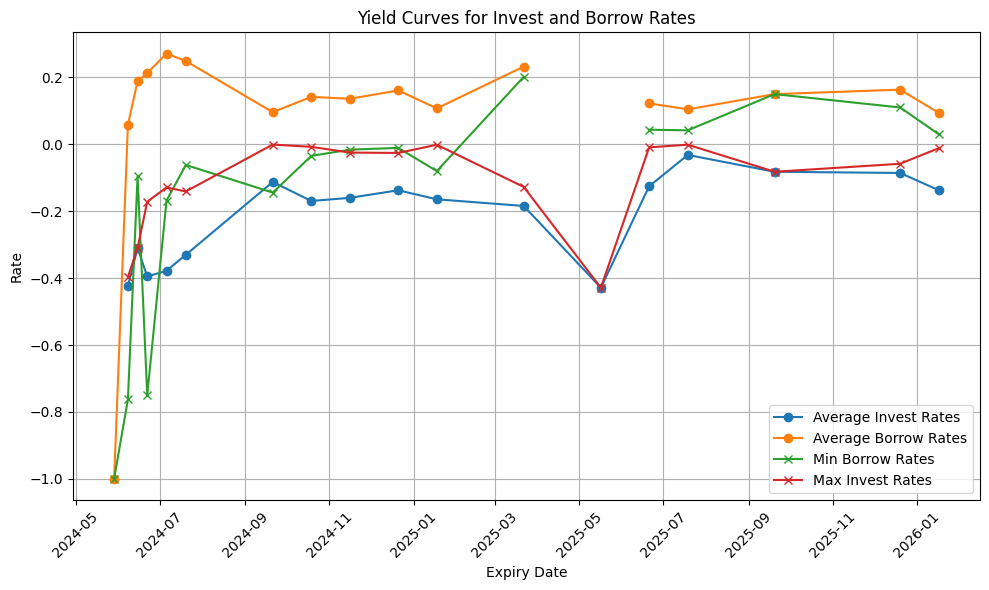

In [94]:
import matplotlib.pyplot as plt
import numpy as np

# Calculate average, min, and max rates for each expiry
average_invest_rates = {}
average_borrow_rates = {}
min_borrow_rates = {}
max_invest_rates = {}

for name, expiries in rates.items():
    for expiry, rate_info in expiries.items():
        if expiry not in average_invest_rates:
            average_invest_rates[expiry] = []
        if expiry not in average_borrow_rates:
            average_borrow_rates[expiry] = []
        if expiry not in min_borrow_rates:
            min_borrow_rates[expiry] = []
        if expiry not in max_invest_rates:
            max_invest_rates[expiry] = []
        
        if rate_info["best_invest"][2] > -0.5:
            average_invest_rates[expiry].append(rate_info["best_invest"][2])
            max_invest_rates[expiry].append(rate_info["best_invest"][2])
        if rate_info["best_borrow"][2] < 0.5:
            average_borrow_rates[expiry].append(rate_info["best_borrow"][2])
            min_borrow_rates[expiry].append(rate_info["best_borrow"][2])

# Calculate the mean, min, and max for each expiry
average_invest_rates = {expiry: np.mean(rates) for expiry, rates in average_invest_rates.items() if len(rates) > 0}
average_borrow_rates = {expiry: np.mean(rates) for expiry, rates in average_borrow_rates.items() if len(rates) > 0}
min_borrow_rates = {expiry: np.min(rates) for expiry, rates in min_borrow_rates.items() if len(rates) > 0}
max_invest_rates = {expiry: np.max(rates) for expiry, rates in max_invest_rates.items() if len(rates) > 0}

# Sort the expiries
sorted_expiries = sorted(average_invest_rates.keys())

# Extract the rates in the sorted order
sorted_invest_rates = [average_invest_rates[expiry] if expiry in average_invest_rates else None for expiry in sorted_expiries]
sorted_borrow_rates = [average_borrow_rates[expiry] if expiry in average_borrow_rates else None for expiry in sorted_expiries]
sorted_min_borrow_rates = [min_borrow_rates[expiry] if expiry in min_borrow_rates else None for expiry in sorted_expiries]
sorted_max_invest_rates = [max_invest_rates[expiry] if expiry in max_invest_rates else None for expiry in sorted_expiries]

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(sorted_expiries, sorted_invest_rates, label='Average Invest Rates', marker='o')
plt.plot(sorted_expiries, sorted_borrow_rates, label='Average Borrow Rates', marker='o')
plt.plot(sorted_expiries, sorted_min_borrow_rates, label='Min Borrow Rates', marker='x')
plt.plot(sorted_expiries, sorted_max_invest_rates, label='Max Invest Rates', marker='x')
plt.xlabel('Expiry Date')
plt.ylabel('Rate')
plt.title('Yield Curves for Invest and Borrow Rates')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [95]:
# Find the overall best borrow and invest rates
best_borrow_rate = None
best_invest_rate = None
best_borrow_details = None
best_invest_details = None

for name, expiries in rates.items():
    for expiry, rate_info in expiries.items():
        borrow_rate = rate_info["best_borrow"][2]
        invest_rate = rate_info["best_invest"][2]
        
        if best_borrow_rate is None or borrow_rate < best_borrow_rate:
            best_borrow_rate = borrow_rate
            best_borrow_details = (name, expiry, rate_info["best_borrow"][0], rate_info["best_borrow"][1])
        
        if best_invest_rate is None or invest_rate > best_invest_rate:
            best_invest_rate = invest_rate
            best_invest_details = (name, expiry, rate_info["best_invest"][0], rate_info["best_invest"][1])

print(f"Overall Best Borrow Rate: {best_borrow_rate}")
print(f"Details: Name: {best_borrow_details[0]}, Expiry: {best_borrow_details[1]}, Strikes: {best_borrow_details[2]} and {best_borrow_details[3]}")
print(f"Overall Best Invest Rate: {best_invest_rate}")
print(f"Details: Name: {best_invest_details[0]}, Expiry: {best_invest_details[1]}, Strikes: {best_invest_details[2]} and {best_invest_details[3]}")


# Get the full info for the best borrow
best_borrow_info = None
for instrument in all_instruments:
    if "Symbol" in instrument and best_borrow_details[0] in instrument["Symbol"]:
        best_borrow_info = instrument
        break
    

# Get the info for the best strikes and the expiry
best_borrow_strikes = None
for expiry in best_borrow_info["Data"]["Snapshot"]["Expiries"]:
    if pd.to_datetime(expiry["Expiry"]) == best_borrow_details[1]:
        best_borrow_strikes = expiry["Strikes"]
        break


# Get the strikes best_borrow_details[2] and best_borrow_details[3]
best_borrow_strike1 = None
best_borrow_strike2 = None

for strike in best_borrow_strikes:
    if strike["Strike"] == best_borrow_details[2]:
        best_borrow_strike1 = strike
    if strike["Strike"] == best_borrow_details[3]:
        best_borrow_strike2 = strike
        
print()
print("Best Borrow Rate Details:")
print(f"Strike 1: {best_borrow_strike1}")
print(f"Strike 2: {best_borrow_strike2}")



Overall Best Borrow Rate: -1.0
Details: Name: QQQ:xcbf, Expiry: 2024-05-28 20:00:00+00:00, Strikes: 452.0 and 451.0
Overall Best Invest Rate: inf
Details: Name: QQQ:xcbf, Expiry: 2024-05-28 20:00:00+00:00, Strikes: 451.0 and 452.0

Best Borrow Rate Details:
Strike 1: {'Index': 75, 'Put': {'Bid': 0.01, 'Ask': 0.02, 'PriceTypeBid': 'Indicative', 'PriceTypeAsk': 'Indicative', 'Uic': 42174149, 'High': 0.11, 'Low': 0.01, 'Open': 0.05, 'LastClose': 0.21732, 'NetChange': -0.20732, 'LastTraded': 0.01, 'BidSize': 4684.0, 'AskSize': 4014.0, 'Volume': 9830.0, 'OpenInterest': 4818.0}, 'Call': {'Bid': 7.21, 'Ask': 7.32, 'PriceTypeBid': 'Indicative', 'PriceTypeAsk': 'Indicative', 'Uic': 42174122, 'High': 7.5, 'Low': 5.3, 'Open': 7.5, 'LastClose': 5.7999, 'NetChange': 1.4001, 'LastTraded': 7.19, 'BidSize': 150.0, 'AskSize': 165.0, 'Volume': 112.0, 'OpenInterest': 639.0}, 'Strike': 452.0}
Strike 2: {'Index': 74, 'Put': {'Bid': 0.01, 'Ask': 0.02, 'PriceTypeBid': 'Indicative', 'PriceTypeAsk': 'Indicativ

In [99]:
# Find and sort all borrow rates
borrow_rates_info = []

for name, expiries in rates.items():
    for expiry, rate_info in expiries.items():
        borrow_rate = rate_info["best_borrow"][2]
        borrow_details = (name, expiry, rate_info["best_borrow"][0], rate_info["best_borrow"][1], borrow_rate)
        borrow_rates_info.append(borrow_details)

# Sort the borrow rates from best to worst
borrow_rates_info_sorted = sorted(borrow_rates_info, key=lambda x: x[4])

# Display the sorted borrow rates
print("Sorted Borrow Rates (from best to worst):")
for borrow_info in borrow_rates_info_sorted:
    print(f"Name: {borrow_info[0]}, Expiry: {borrow_info[1]}, Strikes: {borrow_info[2]} and {borrow_info[3]}, Rate: {borrow_info[4]:.4f}")


Sorted Borrow Rates (from best to worst):
Name: QQQ:xcbf, Expiry: 2024-05-28 20:00:00+00:00, Strikes: 452.0 and 451.0, Rate: -1.0000
Name: SPY:xcbf, Expiry: 2024-05-28 20:00:00+00:00, Strikes: 523.0 and 522.0, Rate: -1.0000
Name: HD:xcbf, Expiry: 2024-05-31 20:00:00+00:00, Strikes: 330.0 and 322.5, Rate: -0.9972
Name: DOW:xcbf, Expiry: 2024-05-31 20:00:00+00:00, Strikes: 59.0 and 55.0, Rate: -0.9920
Name: KMB:xcbf, Expiry: 2024-06-07 20:00:00+00:00, Strikes: 133.0 and 123.0, Rate: -0.7625
Name: MO:xcbf, Expiry: 2024-06-21 20:00:00+00:00, Strikes: 46.0 and 42.5, Rate: -0.7505
Name: QCOM:xcbf, Expiry: 2024-05-31 20:00:00+00:00, Strikes: 217.5 and 200.0, Rate: -0.4855
Name: HD:xcbf, Expiry: 2024-06-07 20:00:00+00:00, Strikes: 332.5 and 305.0, Rate: -0.3979
Name: KMB:xcbf, Expiry: 2024-06-21 20:00:00+00:00, Strikes: 133.0 and 125.0, Rate: -0.1791
Name: GLD:xcbf, Expiry: 2024-07-05 20:00:00+00:00, Strikes: 242.5 and 217.5, Rate: -0.1682
Name: AAPL:xcbf, Expiry: 2024-09-20 20:00:00+00:00, St

In [100]:
calculate_rate(217.5, 200, 1.0, 5.8, 13.05, 0.15, 2/365)

0.5781452066767216